<a href="https://colab.research.google.com/github/arthursl12/MIR/blob/master/Lab10/Lab05.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%%capture
# Descomente e rode para usar no colab
! pip install git+https://github.com/flaviovdf/musica.git

# Decomposição de Matrizes Musicais

**Objetivos**
1. Revisar Decomposição de Matrizes
1. Revisar SVD
1. Aprender um pouco sobre NMF

**Resultado Esperado**
1. Saber fazer uso do SKLearn para separar instrumentos

In [ ]:
from μsica import μsf
from μsica import μsp

from numba import jit

import jax.numpy as jnp
import jax

import librosa
import librosa.display

import IPython.display as ipd

import matplotlib.pyplot as plt

import numpy as np
import pandas as pd

In [ ]:
μsp.init_matplotlib()
plt.ion()

In [ ]:
μsf.download('https://dcc.ufmg.br/~flaviovdf/mir/lab08/IDMT-SMT-DRUMS-V2.zip',
             'files.zip', False)
μsf.extract('files.zip', '.')

files.zip: 274MB [00:21, 13.3MB/s]


## Introdução

Como vimos em sala de aula, a tarefa de separação de fontes (*source separation*) serve para extrair diferentes padrões de aúdio que se repetem em uma música. Aqui, um padrão pode ser visto como informação redundante na matriz do espectrograma de tempo curto. Como tal padrão se repete, a separação de fontes visa capturar os diferentes instrumentos tocados na música.

## Decomposição em Valores Singulares

Em álgebra linear, a decomposição em valores singulares ou singular value decomposition (SVD) é a fatoração de uma matriz real ou complexa, com diversas aplicações importantes em processamento de sinais e estatística.

Formalmente, a decomposição em valores singulares de uma matriz m×n real ou complexa X é uma fatoração ou fatorização na forma: 

$$ X = U \Sigma V^{*} $$ 

Aqui, $U$ é a matriz de vetores singulares à direita. $\Sigma$ é uma matriz diagonal com os valores singulares. Por fim, $V^{*}$ é a transposta conjugada dos valores singulares à direita. *Possivelmente você deve estar pensando: "massa, um monte de termo que sei muito pouco sobre"*. Se este é o seu caso, não se preocupe! Vamos tentar focar em uma ideia mais simples, que faria um matemático chorar, para explicar SVD.

Para tal, uma outra forma de escrever tal equação é:

$$ X = U_s V^{t} $$ 

onde, $U_s = U \Sigma$, ou seja, o produto da primeira parte da equação acima. Aqui, $V^{t}$ é simplesmente transposta de $V$. Não vamos nos preocupar com transpostas conjugadas pois vamos trabalhar com números reais.

Em sua forma correta, $ X = U \Sigma V^{*} $, SVD consegue decompor qualquer matriz, $X$, real ou complexa. A decomposição também vai ser complexa, isto é, $U$, $\Sigma$ e $V$ podem conter números complexos. É importante ressaltar este fato para deixar claro que SVD consegue trabalhar no espectrograma complexo caso seja necessário. Fazemos uso da versão modificada aqui, pois conseguimos visualizar o espectro usando a norma dos números complexos, ou seja, um valor real.

### Como entender SVD melhor?

*Começando com vetores*

Vamos voltar para a nossa simplificação acima: $ X = U_s V^{t} $. Agora, vamos definir $U_s$ como um vetor coluna, i.e.,:

\begin{align}
    U_s &= \begin{bmatrix}
           c_{1} \\
           c_{2} \\
           \vdots \\
           c_{n}
         \end{bmatrix}
  \end{align}

Além do mais, vamos também definir $V$ como um outro vetor coluna. Como trabalhamos com $V^t$, teremos a transposta, ou seja, um vetor linha na nossa expressão de SVD. Segue a forma de $V^t$.

\begin{align}
    V^t &= \begin{bmatrix}
           l_{1}, 
           l_{2}, 
           \cdots,
           l_{m}
         \end{bmatrix}
  \end{align}

A nossa expressão então vira:

\begin{align}
    X &= \begin{bmatrix}
           c_{1} \\
           c_{2} \\
           \vdots \\
           c_{n}
         \end{bmatrix}\begin{bmatrix}
           l_{1}, 
           l_{2}, 
           \cdots,
           l_{m}
         \end{bmatrix}
  \end{align}


Observe como o produto de um vetor coluna de tamanho $(n, 1)$ com um outro linha de tamanho $(1, m)$ gera uma matriz de tamanho $(n, m)$. Agora, uma coisa importante deste produto é que o mesmo tem *posto* matricial igual à um. O que isto quer dizer? Que toda linha ou coluna da matriz resultante é, de certa forma, redundante. Pois as outras são uma combinação linear da mesma. Para entender isto observe o produto abaixo.

![](https://dcc.ufmg.br/~flaviovdf/mir/lab08/figs/fig1.png)

Observe como todas as linhas da matriz acima são da forma: $c_i \cdot [ l_1 \cdots l_m]$. Aqui, $i$ é a linha. Desta forma, todas as linhas tem como base o vetor $ [ l_1 \cdots l_m] $, porém, escalados por uma constante diferente $c_i$.

Observe que a escolha de transformar: $U_s$ e $V$ em vetores colunas foi bem arbitrária. Podemos usar outros tamanhos.

*Aumentando a dimensão um pouco*

Agora, vamos definir $U_s$ como uma matriz com DUAS colunas, i.e.,:

\begin{align}
    U_s &= \begin{bmatrix}
           c_{1,1},\,\, c_{1,2}\\
           c_{2,1},\,\, c_{2,2}\\
           \vdots \\
           c_{n,1},\,\, c_{n,2}
         \end{bmatrix}
  \end{align}

Similarmente, segue a nova forma de $V^t$.

\begin{align}
    V^t &= \begin{bmatrix}
           l_{1, 1}, \,\,
           l_{1, 2}, \,\,
           \cdots, \,\,
           l_{1, m} \\
           l_{2, 1}, \,\,
           l_{2, 2}, \,\,
           \cdots , \,\,
           l_{2, m} \\
         \end{bmatrix}
  \end{align}

Observe como será 

\begin{align}
X = \begin{bmatrix}
c_{1,1}l_{1,1} + c_{1,2}l_{2,1} ,\,\,\,\, c_{1,1}l_{1,2} + c_{1,2}l_{2,2} , \,\,\cdots, \,\,\,\, c_{1,1}l_{1,m} + c_{1,2}l_{2,m} \\
c_{2,1}l_{1,1} + c_{2,2}l_{2,1} ,\,\,\,\, c_{2,1}l_{1,2} + c_{2,2}l_{2,2} , \,\,\cdots, \,\,\,\, c_{2,1}l_{1,m} + c_{2,2}l_{2,m} \\
\cdots \\
c_{n,1}l_{1,1} + c_{n,2}l_{2,1} ,\,\,\,\, c_{n,1}l_{1,2} + c_{n,2}l_{2,2} , \,\,\cdots, \,\,\,\, c_{n,1}l_{1,m} + c_{n,2}l_{2,m}
\end{bmatrix}
\end{align}

Agora, eu sei que a expressão acima está BEM densa. Mas foque apenas na primeira linha:

$$ [ c_{1,1}l_{1,1} + c_{1,2}l_{2,1} ,\,\,\,\, c_{1,1}l_{1,2} + c_{1,2}l_{2,2} , \,\,\cdots, \,\,\,\, c_{1,1}l_{1,m} + c_{1,2}l_{2,m} ] $$

Atente para o fato de que o vetor:

$$ [ c_{1,1}l_{1,1} ,\,\,\,\, c_{1,1}l_{1,2} , \,\,\cdots, \,\,\,\, c_{1,1}l_{1,m}  ] $$

É o mesmo resultado que tinhamos antes quando consideramos apenas uma dimensão. O mesmo está sendo somado do vetor:

$$ [ c_{1,2}l_{2,1} ,\,\,\,\, c_{1,2}l_{2,2} , \,\,\cdots, \,\,\,\, c_{1,2}l_{2,m}  ] $$

Qual o motivo disto ser interessante? Podemos re-escrever o produto matricial acima como sendo:

\begin{align}
    X &= \begin{bmatrix}
           c_{1, 1} \\
           c_{2, 1} \\
           \vdots \\
           c_{n, 1}
         \end{bmatrix}\begin{bmatrix}
           l_{1, 1}, 
           l_{1, 2}, 
           \cdots,
           l_{1, m}
         \end{bmatrix} +
         \begin{bmatrix}
           c_{1, 2} \\
           c_{2, 2} \\
           \vdots \\
           c_{n, 2}
         \end{bmatrix}\begin{bmatrix}
           l_{2, 1}, 
           l_{2, 2}, 
           \cdots,
           l_{2, m}
         \end{bmatrix}
  \end{align}

Que são **dois** produtos extermos somados. Que beleza, que maravilha. Agora, *caso o primeiro produto externo seja independente linearmente do segundo*, a matriz resultante tem posto dois. Observe que tem uma premissa um pouco forte aqui, porém garantias teóricas de SVD vão nos assegurar que os dois produtos externos são independentes.

No fim do dia SVD é apenas isto, uma forma de escrever matrizes como somas de produtos externos. Isto é interessante pois como cada produto externo captura fatores independentes dos outros, os mesmos codificam informações diferentes da nossa matriz. Do ponto de vista geral, temos:


![](https://dcc.ufmg.br/~flaviovdf/mir/lab08/figs/fig2.png)

**A escolha de quantos produtos externos, ou posto final, será sua**

## Pequeno desvio, uma bateria

Antes de começar a fazer uso de SVD vamos olhar para o espectrograma de um pequeno trecho musical.

In [ ]:
μsf.download('http://dcc.ufmg.br/~flaviovdf/mir/examples/drum.wav', 'drum.wav',
             False)

drum.wav: 331kB [00:02, 116kB/s]


In [ ]:
wav, sr = librosa.load('drum.wav')
ipd.Audio(wav, rate=sr)

*Escute o aúdio acima, quantos timbres diferentes você consegue identificar?*

Como você já deve ter percebido, o aúdio é um pequeno trecho de uma bateria.
Você deve ouvir ao menos três timbres:

1. Um bumbo, fazendo "tu"
1. Uma caixa, fazendo "pa"
1. Um chimbal, fazendo "ts"

O interessante da bateria é que o momento qual cada tambor ou prato é tocado fica bem ressaltado, vide o plot abaixo.


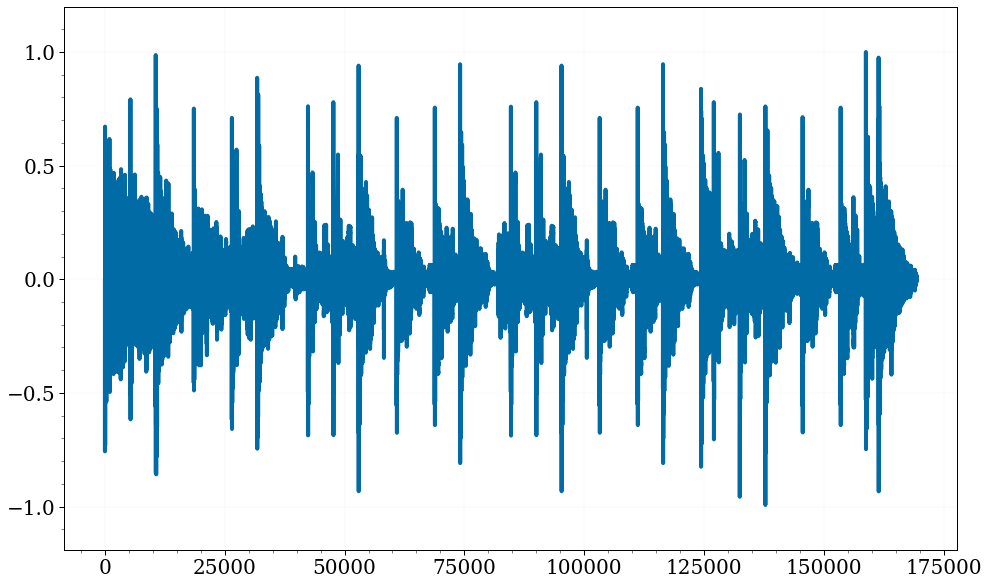

In [ ]:
plt.plot(wav)

### SVD como um problema de otimização

Agora voltando para SVD. Observe como o espectrograma é uma matriz de valores complexas

In [ ]:
S = librosa.stft(wav)
S[1, 0]

(21.010492-2.903927e-15j)

In [ ]:
S.real

array([[-2.04294434e+01, -9.60280991e+00,  8.57357323e-01, ...,
         2.86548818e-03,  2.77445111e-02,  1.50528997e-01],
       [ 2.10104923e+01, -1.22868609e+00, -5.03100574e-01, ...,
        -2.04157755e-02,  7.20952218e-03, -6.23248741e-02],
       [-2.65991325e+01,  1.11167183e+01,  2.21814632e+00, ...,
         1.98108591e-02,  2.22539827e-02, -1.32204458e-01],
       ...,
       [-1.06431765e-03,  6.45676104e-04,  5.56440573e-05, ...,
         2.59905064e-05,  3.07723647e-04, -2.18525412e-03],
       [ 9.81305144e-04, -3.17966886e-04, -2.34028790e-04, ...,
        -1.96095876e-04, -1.19744625e-04, -1.15760497e-03],
       [-6.83862483e-04,  5.79404514e-05,  3.53292795e-04, ...,
         3.19004641e-04,  5.40562265e-04,  3.09617771e-03]], dtype=float32)

In [ ]:
S.imag

array([[ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [-2.9039271e-15,  1.0714315e+01, -2.4061909e-01, ...,
        -5.8182417e-03,  1.4468883e-02,  1.1686841e-01],
       [-4.6189223e-15,  3.4777143e+00, -4.1857952e-01, ...,
         3.1232927e-02, -3.4713306e-02, -9.1028683e-02],
       ...,
       [ 1.7803019e-16,  3.2414848e-04, -2.9644073e-04, ...,
        -1.3354661e-04, -3.1610118e-05,  2.0205786e-03],
       [ 5.1694760e-16, -6.9710822e-04,  3.7518269e-04, ...,
        -8.7013963e-05, -2.8488161e-05, -2.5324591e-03],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00]], dtype=float32)

Como é comum, vamos trabalhar na norma do número complexo. Assim, fazemos uso de `np.abs` para pegar tal norma. Isto é, sendo $z$ o valor complexo, $z = a + i\cdot b$, então sua norma é $|z| = \sqrt{a^2 + b^2}$.

Vamos guardar também o ângulo. Teremos um uso para o mesmo no futuro.

In [ ]:
X = np.abs(S)
A = np.angle(S)

In [ ]:
def plot_spec(X, fig=None, ax=None, color=True):
    '''Aqui X tem que ser o absoluto'''

    if fig is None and ax is None:
        fig, ax = plt.subplots()

    X_db = librosa.amplitude_to_db(X, ref=np.max)
    img = librosa.display.specshow(X_db, x_axis='time', y_axis='log', ax=ax)
    if color:
        fig.colorbar(img, ax=ax, format="%+2.f dB");

Por fim, temos o nosso espectrograma de tempo curto!

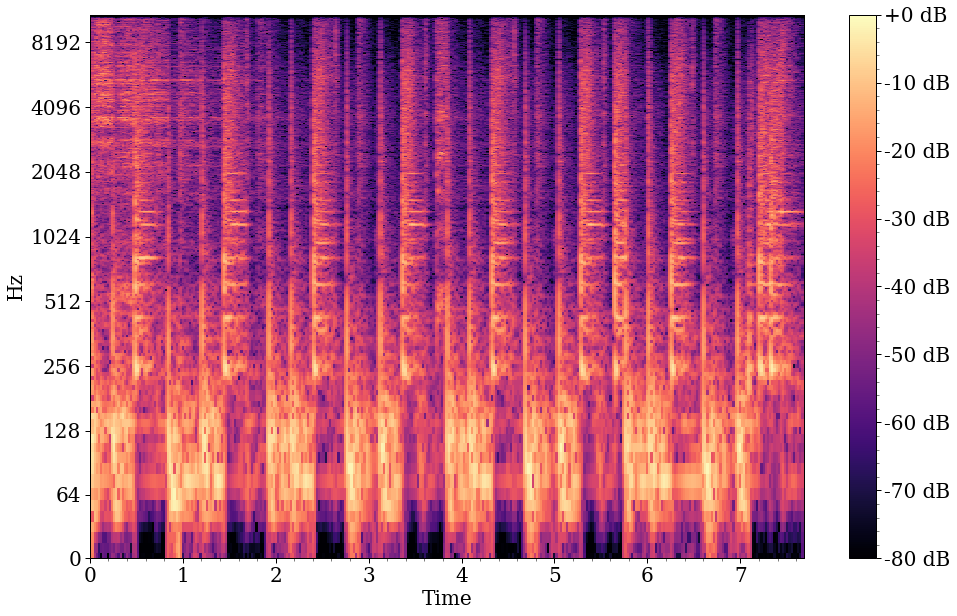

In [ ]:
plot_spec(X)


Agora vamos tentar colar as duas coisas juntas. A bateria tem uma série de informação que se repete, abaixo tentei ressaltar algumas partes.

![](https://dcc.ufmg.br/~flaviovdf/mir/lab08/figs/fig3.png)

Parece que algums frequências aparecem mais em alguns tempos. Primeiro temos frequências baixa, depois alta, depois baixa. Tu, pa, tu, pa.... Além disso deve ter um ts, ts, ts constante por aí. O importante é. INFORMAÇÃO REDUNDANTE. Que ferramenta bacana aprendemos para achar tal informação?


## Otimizando SVD


Observe que podemos re-escrever nossa definição de SVD da seguinte forma:

$$ U_s V^{t} - X = \mathbf{0} $$ 

Onde, $\mathbf{0}$ é uma matriz do mesmo tamanho de X, porém composta apenas de zeros. Ora, se a diferença acima é a matriz de zeros, isto quer dizer que a norma dos dois lados (isto vai valer para qualquer norma) tem que ser zero! 

$$ || U_s V^{t} - X || =  || \mathbf{0} || $$ 

Você já deve estar pensando, ok, vou otimizar alguma coisa. Portando, vamos trabalhar com normas *ponto-a-ponto*:

$$ || U_s V^{t} - X ||_{p} =  0 $$

Onde a norma é definida como:

$$|| M \|_{p} = \left( \sum_{i=1}^n \sum_{j=1}^m |a_{i,j}|^p \right)^{1/p}$$

Vamos fazer uso da norma $p=2$ e elevar ao quadrado, tudo é mais fácil ao quadrado. E no fim do dia é um pouco por isso mesmo.

$$ || U_s V^{t} - X ||^2_{2} = \sum_{i=1}^n \sum_{j=1}^m ( (U_s V^{t})_{i,j} - X_{i,j})^2 = 0 $$

Uma soma de quadrados. Que lindo. Conhecemos os dados $X$, nosso espectrograma. Desconhecemos $U_s$ e $V$. Como achar? Deriva, otimiza, seja feliz, use JAX.

In [ ]:
@jax.jit
def svd_loss(Us, Vh, X):
    X_model = Us @ Vh
    return jnp.mean((X - X_model) ** 2)

In [ ]:
grad_fn = jax.grad(svd_loss, argnums=(0, 1))

Agora vamos testar!

In [ ]:
k = 3
rows, cols = X.shape
Us = jnp.array(np.random.normal(size=(rows, k)))
Vh = jnp.array(np.random.normal(size=(k, cols)))

lr = 10
for i in range(5000):
    Us_prime, Vh_prime = grad_fn(Us, Vh, X)
    Us = Us - lr * Us_prime
    Vh = Vh - lr * Vh_prime
    if i % 100 == 0:
        print(i, svd_loss(Us, Vh, X))

0 12.666249
100 3.9982464
200 2.375568
300 2.3614879
400 2.3175623
500 2.1995115
600 2.0665932
700 2.009096
800 1.993216
900 1.9888395
1000 1.9873992
1100 1.986812
1200 1.9865226
1300 1.9863579
1400 1.9862536
1500 1.9861834
1600 1.986134
1700 1.9860983
1800 1.9860722
1900 1.986053
2000 1.986039
2100 1.9860283
2200 1.9860206
2300 1.9860148
2400 1.9860103
2500 1.9860071
2600 1.9860047
2700 1.9860029
2800 1.9860015
2900 1.9860007
3000 1.986
3100 1.9859992
3200 1.9859989
3300 1.9859986
3400 1.9859985
3500 1.9859983
3600 1.9859982
3700 1.9859982
3800 1.9859982
3900 1.9859982
4000 1.9859982
4100 1.9859978
4200 1.9859978
4300 1.9859979
4400 1.9859978
4500 1.9859979
4600 1.9859978
4700 1.9859979
4800 1.9859978
4900 1.9859978


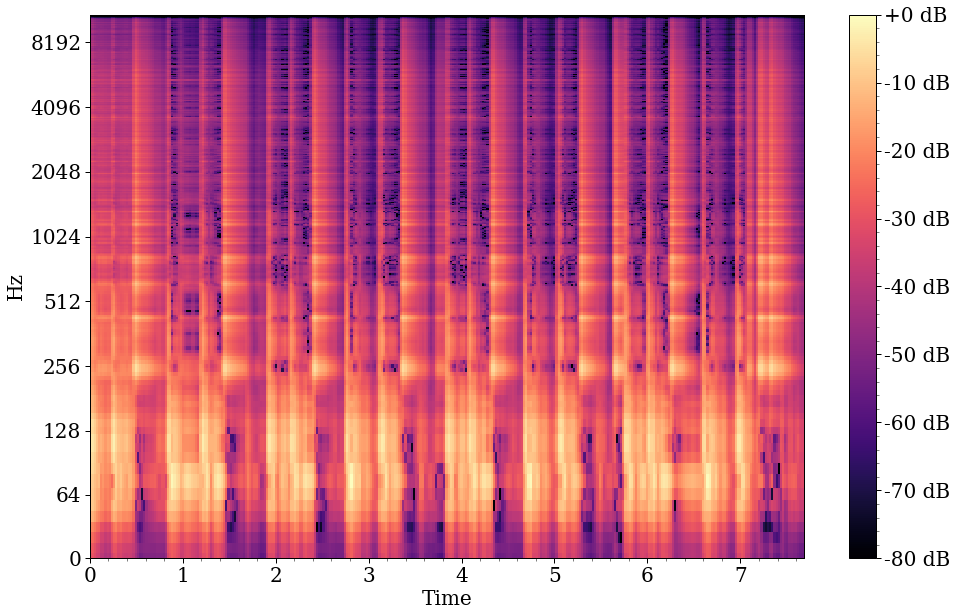

In [ ]:
# Observe como funciona bem
plot_spec(Us @ Vh)

Abaixo tenho uma função que plota a parte recuperada por cada "produto externo". Ou seja, olho apenas para uma linha/coluna de Us e Vt.


In [ ]:
def recover_from_one(Us, Vh, factor):
    right = Us[:, factor][:, np.newaxis]
    left = Vh[factor][np.newaxis]
    return right.dot(left)

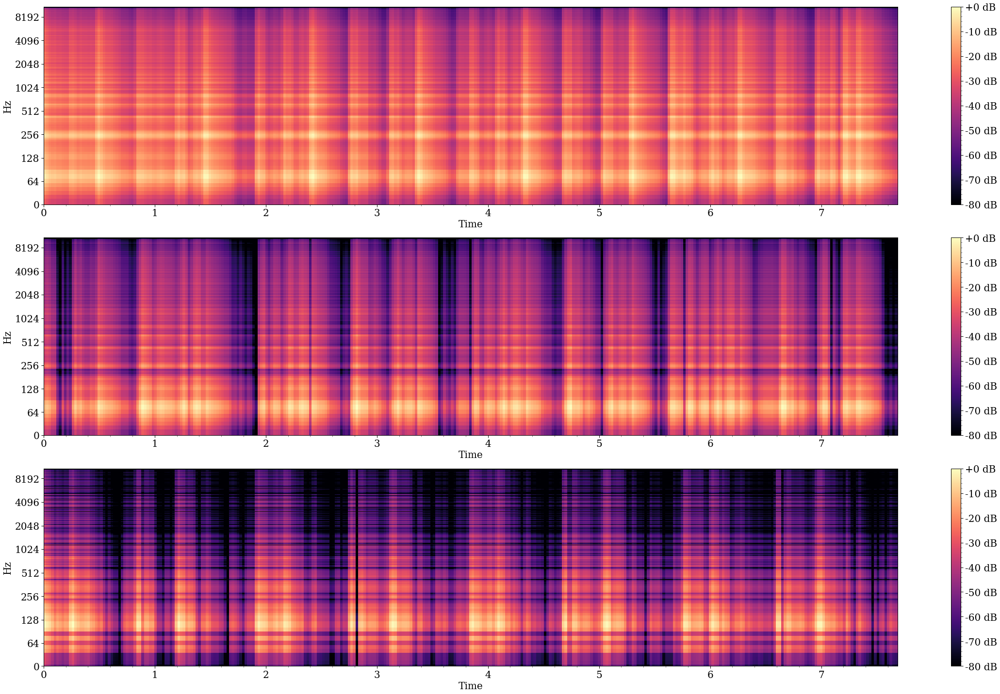

In [ ]:
fig, axes = plt.subplots(k, 1, figsize=(32, 20))
for i in range(k):
    X_model = recover_from_one(Us, Vh, i)
    plot_spec(X_model, fig, axes[i])
fig.tight_layout()

Codificando tudo em uma função para uso futuro!

In [249]:
def svd(X, k, lr=10, max_iter=5000, verbose=True, Us=None, Vh=None):
    # Tirando as medidas da matriz X passada e não da global
    rows, cols = X.shape

    # Caso não passe k, as matrizes foram iniciadas por fora
    if k is None:
        assert(Us is not None or Vh is not None)
    
    # Caso Us não foi iniciada
    if Us is None:
        if k is None: # Vh foi iniciada ?
            assert(Vh is not None)
            k = Vh.shape[0]
        Us = jnp.array(np.random.normal(size=(rows, k)))

    # Aqui com certeza Us foi inicializada (na função ou fora)
    # Inice Vh caso não tenha sido por fora
    if Vh is None:
        k = Us.shape[1]
        Vh = jnp.array(np.random.normal(size=(k, cols))) 

    # Verifique os tamanhos
    assert(Us.shape[1] == Vh.shape[0])
    assert(Us.shape[1] <= X.shape[1])
    
    # Finalmente, SVD
    X = jnp.asarray(X)
    Us = jnp.asarray(Us)
    Vh = jnp.asarray(Vh)

    @jax.jit
    def svd_loss(Us, Vh, X):
        X_model = Us @ Vh
        return jnp.mean((X - X_model) ** 2)
    grad_fn = jax.grad(svd_loss, argnums=(0, 1))

    for i in range(max_iter):
        Us_prime, Vh_prime = grad_fn(Us, Vh, X)
        Us = Us - lr * Us_prime
        Vh = Vh - lr * Vh_prime
        if i % 100 == 0 and verbose:
            print(i, svd_loss(Us, Vh, X))
    return Us, Vh

0 3.2721972
100 0.6734764
200 0.60193145
300 0.4676962
400 0.2911153
500 0.25448412
600 0.23876807
700 0.2116444
800 0.17092912
900 0.13255472
1000 0.10893293
1100 0.09651095
1200 0.08905118
1300 0.083427176
1400 0.07863201
1500 0.07450481
1600 0.07109313
1700 0.06841182
1800 0.06639753
1900 0.06493717
2000 0.06390575
2100 0.06319066
2200 0.06270114
2300 0.06236888
2400 0.06214461
2500 0.061993748
2600 0.06189247
2700 0.06182454
2800 0.061778996
2900 0.061748426
3000 0.0617279
3100 0.061714094
3200 0.061704785
3300 0.061698504
3400 0.061694246
3500 0.061691348
3600 0.06168938
3700 0.061688025
3800 0.06168709
3900 0.061686445
4000 0.061685994
4100 0.06168568
4200 0.061685454
4300 0.061685294
4400 0.061685175
4500 0.0616851
4600 0.061685033
4700 0.061684992
4800 0.061684962
4900 0.061684936


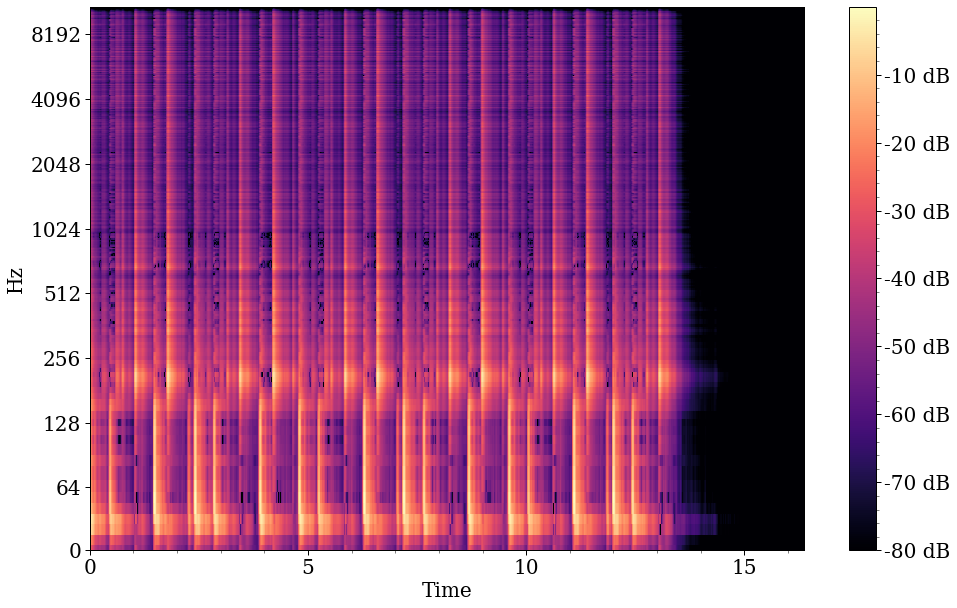

In [250]:
Us, Vh = svd(X, 3, verbose=True)
plot_spec(Us @ Vh)

## Voltando para a música original

Infelizmente nosso espectrograma tem fatores complexos. Nosso SVD não fez uso de tais fatores na sua otimização. Até que seria possível com JAX, mas preferi não fazer. Portanto, vou voltar o espectrograma para complexo usando o ângulo que guardamos antes. Escute cada trecho que é recuperado por cada fator do nosso SVD. *Fez sentido?*

In [ ]:
X_model = recover_from_one(Us, Vh, 0)
S_model = X_model * np.exp(1j * A)
wav_model = librosa.istft(np.asarray(S_model))
ipd.Audio(wav_model, rate=sr)

In [ ]:
X_model = recover_from_one(Us, Vh, 1)
S_model = X_model * np.exp(1j * A)
wav_model = librosa.istft(np.asarray(S_model))
ipd.Audio(wav_model, rate=sr)

In [ ]:
X_model = recover_from_one(Us, Vh, 2)
S_model = X_model * np.exp(1j * A)
wav_model = librosa.istft(np.asarray(S_model))
ipd.Audio(wav_model, rate=sr)

## Decomposição Não Negativa

Um dos problemas de SVD é que os valores recuperados podem ser negativos. Por exemplo, observe o primeiro fator abaixo:

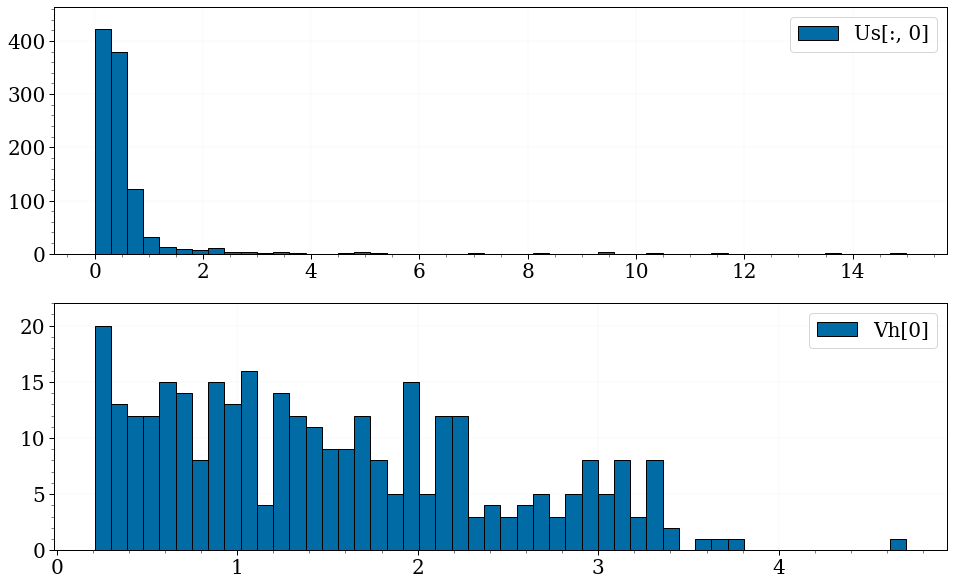

In [ ]:
fig, axes = plt.subplots(2, 1)

axes[0].hist(Us[:, 0].ravel(), bins=50, edgecolor='k', label='Us[:, 0]')
axes[0].legend()

axes[1].hist(Vh[0].ravel(), bins=50, edgecolor='k', label='Vh[0]')
axes[1].legend()

Como temos números negativos, é complicado interpretar algum tipo de presença ou ausência de sinal. Isto vem do fato de que ao recuperar X com este fator teremos:

\begin{align}
    X &= \begin{bmatrix}
           c_{1, 1} \\
           c_{2, 1} \\
           \vdots \\
           c_{n, 1}
         \end{bmatrix}\begin{bmatrix}
           l_{1, 1}, 
           l_{1, 2}, 
           \cdots,
           l_{1, m}
         \end{bmatrix}
  \end{align}

Na expressão acima, podemos ter multiplicações de positivos com positivos, positivos com negativos (e vice-versa), ou negativos com negativos. Como X é toda positiva, seria melhor que os nossos fatores também fosse. Assim pelo menos podemos interpretar que quanto maior o valor, maior o sinal.

Existe uma "variação de SVD" (dizer que é variação é mentira, mas ok) onde podemos forçar que tudo seja positivo. A mesma está implementada abaixo.

In [253]:
def nmf(X, k, max_iter=5000, verbose=True, Us=None, Vh=None):
    # Tirando as medidas da matriz X passada e não da global
    rows, cols = X.shape

    # Caso não passe k, as matrizes foram iniciadas por fora
    if k is None:
        assert(Us is not None or Vh is not None)
    
    # Caso Us não foi iniciada
    if Us is None:
        if k is None: # Vh foi iniciada ?
            assert(Vh is not None)
            k = Vh.shape[0]
        Us = jnp.array(np.random.uniform(size=(rows, k)))

    # Aqui com certeza Us foi inicializada (na função ou fora)
    # Inice Vh caso não tenha sido por fora
    if Vh is None:
        k = Us.shape[1]
        Vh = jnp.array(np.random.uniform(size=(k, cols))) 

    # Verifique os tamanhos
    assert(Us.shape[1] == Vh.shape[0])
    assert(Us.shape[1] <= X.shape[1])

    # Finalmente, NMF
    X = jnp.asarray(X)
    Us = jnp.asarray(Us)
    Vh = jnp.asarray(Vh)

    for i in range(max_iter):
        Us = Us * ((X @ Vh.T) / (((Us @ Vh) @ Vh.T) + 0.0001))
        Vh = Vh * ((Us.T @ X) / (((Us.T @ Us) @ Vh) + 0.0001))
        if i % 100 == 0 and verbose:
            X_model = Us @ Vh
            print(i, jnp.mean((X - X_model) ** 2))
    return Us, Vh

Us, Vh = nmf(X, 3)

0 0.29743317
100 0.062107716
200 0.062011868
300 0.06198272
400 0.06195544
500 0.06192431
600 0.061915033
700 0.061911613
800 0.061910026
900 0.06190776
1000 0.0619065
1100 0.06190603
1200 0.06190533
1300 0.061904818
1400 0.061904427
1500 0.061903995
1600 0.061903518
1700 0.06190335
1800 0.061903022
1900 0.061902978
2000 0.06190288
2100 0.06190286
2200 0.061902843
2300 0.061902832
2400 0.06190282
2500 0.061902817
2600 0.06190281
2700 0.061902795
2800 0.061902784
2900 0.06190278
3000 0.06190277
3100 0.061902687
3200 0.061902687
3300 0.061902676
3400 0.061902665
3500 0.061902653
3600 0.061902642
3700 0.06190263
3800 0.061902612
3900 0.06190259
4000 0.06190256
4100 0.06190253
4200 0.061902482
4300 0.061902437
4400 0.061902374
4500 0.061902296
4600 0.06190221
4700 0.061902102
4800 0.061901983
4900 0.06190184


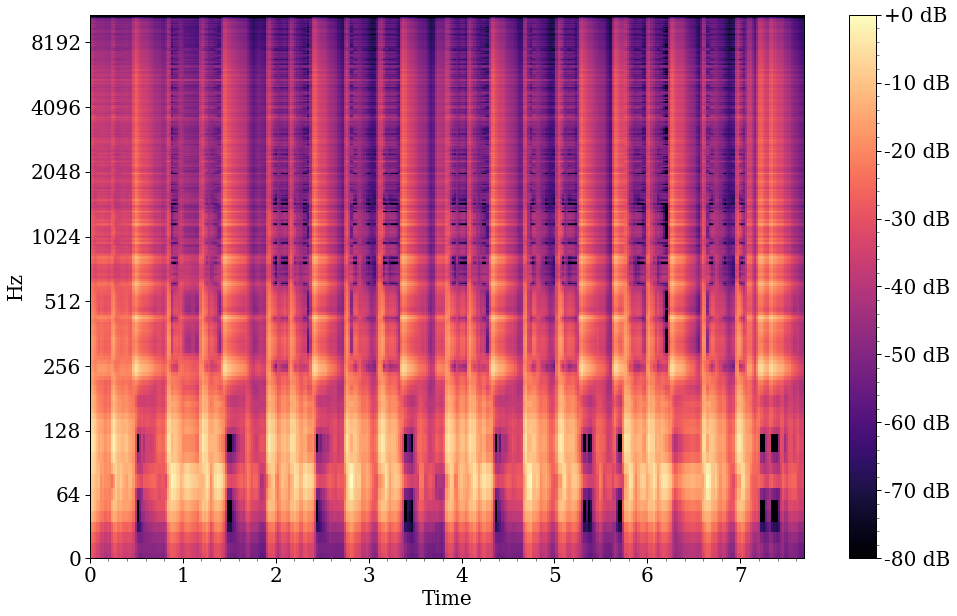

In [ ]:
plot_spec(Us @ Vh)

Observe que agora tudo é não negativo

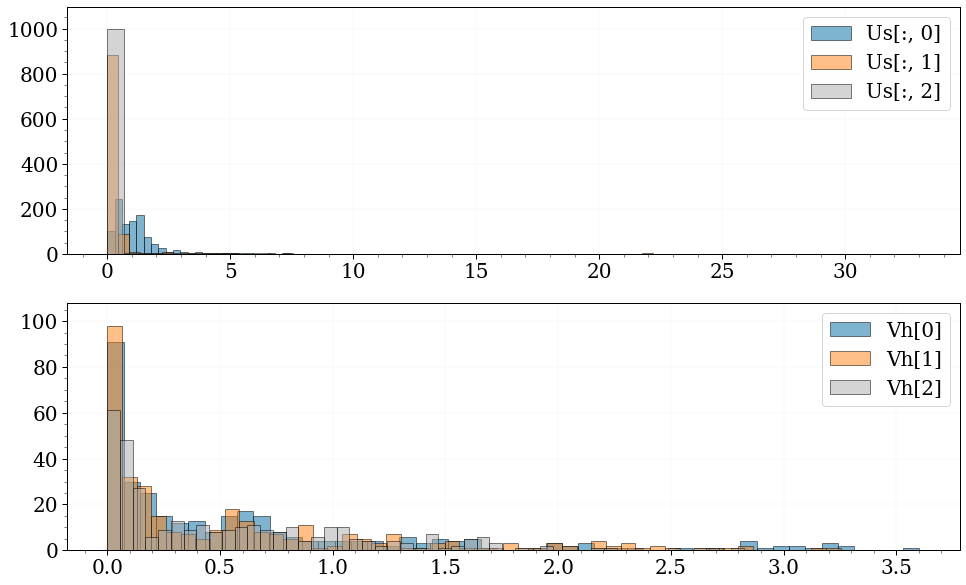

In [ ]:
fig, axes = plt.subplots(2, 1)

for i in range(k):
    axes[0].hist(Us[:, i].ravel(), bins=50, edgecolor='k', label=f'Us[:, {i}]',
                 alpha=0.5)
    axes[1].hist(Vh[i].ravel(), bins=50, edgecolor='k', label=f'Vh[{i}]',
                 alpha=0.5)
axes[0].legend()
axes[1].legend()

Observe como os fatores mudam, ficam mais esparsos. Agora, podemos recuperar como antes. *Melhorou?*

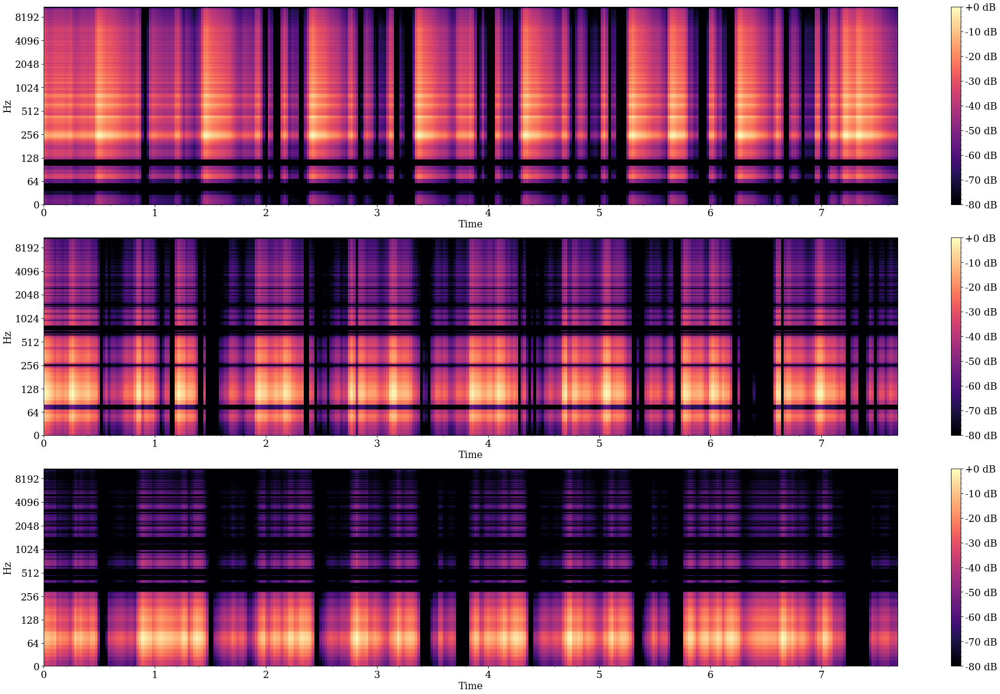

In [ ]:
fig, axes = plt.subplots(k, 1, figsize=(32, 20))
for i in range(k):
    X_model = recover_from_one(Us, Vh, i)
    plot_spec(X_model, fig, axes[i])
fig.tight_layout()

In [ ]:
X_model = recover_from_one(Us, Vh, 0)
S_model = X_model * np.exp(1j * A)
wav_model = librosa.istft(np.asarray(S_model))
ipd.Audio(wav_model, rate=sr)

In [ ]:
X_model = recover_from_one(Us, Vh, 1)
S_model = X_model * np.exp(1j * A)
wav_model = librosa.istft(np.asarray(S_model))
ipd.Audio(wav_model, rate=sr)

In [ ]:
X_model = recover_from_one(Us, Vh, 2)
S_model = X_model * np.exp(1j * A)
wav_model = librosa.istft(np.asarray(S_model))
ipd.Audio(wav_model, rate=sr)

## Sua Tarefa (Finalmente)

Usando a base anotada de toques de bateria do IDMT (já baixada, mas caso queira a original [venha aqui](https://www.idmt.fraunhofer.de/en/publications/datasets/drums.html)), sua tarefa será em decompor pequenas faixas de bateria. A base já foi baixada neste notebook. Os WAVs da mesma estão em ```audio/```.

In [ ]:
! ls audio

RealDrum01_00#HH#train.wav    WaveDrum02_21#HH#train.wav
RealDrum01_00#KD#train.wav    WaveDrum02_21#HH.wav
RealDrum01_00#MIX.wav	      WaveDrum02_21#KD#train.wav
RealDrum01_00#SD#train.wav    WaveDrum02_21#KD.wav
RealDrum01_01#HH#train.wav    WaveDrum02_21#MIX.wav
RealDrum01_01#KD#train.wav    WaveDrum02_21#SD#train.wav
RealDrum01_01#MIX.wav	      WaveDrum02_21#SD.wav
RealDrum01_01#SD#train.wav    WaveDrum02_22#HH#train.wav
RealDrum01_02#HH#train.wav    WaveDrum02_22#HH.wav
RealDrum01_02#KD#train.wav    WaveDrum02_22#KD#train.wav
RealDrum01_02#MIX.wav	      WaveDrum02_22#KD.wav
RealDrum01_02#SD#train.wav    WaveDrum02_22#MIX.wav
RealDrum01_03#HH#train.wav    WaveDrum02_22#SD#train.wav
RealDrum01_03#KD#train.wav    WaveDrum02_22#SD.wav
RealDrum01_03#MIX.wav	      WaveDrum02_23#HH#train.wav
RealDrum01_03#SD#train.wav    WaveDrum02_23#HH.wav
RealDrum01_04#HH#train.wav    WaveDrum02_23#KD#train.wav
RealDrum01_04#KD#train.wav    WaveDrum02_23#KD.wav
RealDrum01_04#MIX.wav	      WaveDrum02_2

Para carregar todos use glob. Sua tarefa será fazer uso dos arquivos MIX, que já misturam todas os tambores. Observe que temos diferentes tipos de baterias. TechnoDrums, WaveDrums (eletrônicas) e RealDrums.

In [ ]:
import glob

files = glob.glob('audio/*MIX*.wav')
files

['audio/RealDrum01_11#MIX.wav',
 'audio/WaveDrum02_05#MIX.wav',
 'audio/RealDrum01_04#MIX.wav',
 'audio/WaveDrum02_28#MIX.wav',
 'audio/TechnoDrum01_02#MIX.wav',
 'audio/WaveDrum02_18#MIX.wav',
 'audio/WaveDrum02_21#MIX.wav',
 'audio/WaveDrum02_39#MIX.wav',
 'audio/WaveDrum01_05#MIX.wav',
 'audio/WaveDrum02_48#MIX.wav',
 'audio/WaveDrum01_01#MIX.wav',
 'audio/WaveDrum02_53#MIX.wav',
 'audio/WaveDrum02_01#MIX.wav',
 'audio/WaveDrum01_04#MIX.wav',
 'audio/TechnoDrum01_06#MIX.wav',
 'audio/WaveDrum02_24#MIX.wav',
 'audio/WaveDrum02_02#MIX.wav',
 'audio/WaveDrum02_60#MIX.wav',
 'audio/WaveDrum01_02#MIX.wav',
 'audio/RealDrum01_02#MIX.wav',
 'audio/WaveDrum02_11#MIX.wav',
 'audio/WaveDrum01_07#MIX.wav',
 'audio/RealDrum01_07#MIX.wav',
 'audio/WaveDrum02_55#MIX.wav',
 'audio/WaveDrum02_19#MIX.wav',
 'audio/WaveDrum02_59#MIX.wav',
 'audio/WaveDrum02_41#MIX.wav',
 'audio/WaveDrum02_54#MIX.wav',
 'audio/WaveDrum02_08#MIX.wav',
 'audio/WaveDrum02_13#MIX.wav',
 'audio/WaveDrum02_46#MIX.wav',
 'au

In [ ]:
wav, sr = librosa.load(files[1])
ipd.Audio(wav, rate=sr)

In [ ]:
! ls annotation_xml

RealDrum01_00#MIX.xml	 WaveDrum01_07#MIX.xml	WaveDrum02_30#MIX.xml
RealDrum01_01#MIX.xml	 WaveDrum01_08#MIX.xml	WaveDrum02_31#MIX.xml
RealDrum01_02#MIX.xml	 WaveDrum01_09#MIX.xml	WaveDrum02_32#MIX.xml
RealDrum01_03#MIX.xml	 WaveDrum02_01#MIX.xml	WaveDrum02_33#MIX.xml
RealDrum01_04#MIX.xml	 WaveDrum02_02#MIX.xml	WaveDrum02_34#MIX.xml
RealDrum01_05#MIX.xml	 WaveDrum02_03#MIX.xml	WaveDrum02_35#MIX.xml
RealDrum01_06#MIX.xml	 WaveDrum02_04#MIX.xml	WaveDrum02_36#MIX.xml
RealDrum01_07#MIX.xml	 WaveDrum02_05#MIX.xml	WaveDrum02_37#MIX.xml
RealDrum01_08#MIX.xml	 WaveDrum02_06#MIX.xml	WaveDrum02_38#MIX.xml
RealDrum01_09#MIX.xml	 WaveDrum02_07#MIX.xml	WaveDrum02_39#MIX.xml
RealDrum01_10#MIX.xml	 WaveDrum02_08#MIX.xml	WaveDrum02_40#MIX.xml
RealDrum01_11#MIX.xml	 WaveDrum02_09#MIX.xml	WaveDrum02_41#MIX.xml
RealDrum01_12#MIX.xml	 WaveDrum02_10#MIX.xml	WaveDrum02_42#MIX.xml
RealDrum01_13#MIX.xml	 WaveDrum02_11#MIX.xml	WaveDrum02_43#MIX.xml
TechnoDrum01_00#MIX.xml  WaveDrum02_12#MIX.xml	WaveDrum02_44#M

Por motivos que eu nunca vou entender, os autores fizeram uso de XML para as anotações. Abaixo segue um exemplo de arquivo.

In [ ]:
! cat annotation_xml/RealDrum01_00#MIX.xml

<?xml version="1.0" encoding="UTF-8" standalone="yes"?>
<instrumentRecording>
  <globalParameter>
    <audioFileName>RealDrum01_00#MIX.wav</audioFileName>
    <recordingArtist>Feliks Weber</recordingArtist>
    <mixGroundTrouthAvailable>false</mixGroundTrouthAvailable>
    <mixGroundTrouthHasInterference>true</mixGroundTrouthHasInterference>
    <audioTrainingFileName>RealDrum01_00#HH#train.wav</audioTrainingFileName>
    <audioTrainingFileName>RealDrum01_00#KD#train.wav</audioTrainingFileName>
    <audioTrainingFileName>RealDrum01_00#SD#train.wav</audioTrainingFileName>
  </globalParameter>
  <transcription>
    <event>
      <pitch>0</pitch>
      <onsetSec>0.08585</onsetSec>
      <offsetSec>0.08585</offsetSec>
      <instrument>HH</instrument>
    </event>
    <event>
      <pitch>0</pitch>
      <onsetSec>0.091791</onsetSec>
      <offsetSec>0.091791</offsetSec>
      <instrument>KD</instrument>
    </event>
    <event>
      <pitch>0</pitch>
      <onsetSec>0.50431</onsetSec>
   

Com BeautifulSoup você consegue extrair os tempos e nomes dos instrumentos.

In [ ]:
from bs4 import BeautifulSoup
with open('annotation_xml/RealDrum01_00#MIX.xml') as f:
    events = BeautifulSoup(f).findAll('event')
    times = []
    names = []
    for event in events:
        times.append(float(event.find('onsetsec').text))
        names.append(event.find('instrument').text)

**Sua Tarefa na Prática**

A figura abaixo mostra um exemplo do Librosa extraindo **curvas** de batidas com dois métodos diferentes. Em particular estamos comparando o [Onset Strength](https://www.audiolabs-erlangen.de/resources/MIR/FMP/C6/C6S1_OnsetDetection.html) e o [Predominant Local Pulse](https://www.audiolabs-erlangen.de/resources/MIR/FMP/C6/C6S3_PredominantLocalPulse.html).

![](https://librosa.org/doc/latest/_images/librosa-beat-plp-1_01.png)

Além do mais, com o nosso conhecimento de SVD e NMF sabemos decompor músicas. Vamos combinar os dois.


1. Você deve iniciar a matriz Us com frequências comuns em uma bateria. Caso queira, use os quatro quartis dos arquivos de cada tambor isolado (veja os WAVS).
1. Você deve iniciar a matriz Vt com os tempos de batidas.
1. Avalie se funcione, altera o número de fatores latentes extraídos por SVD/NMF.
1. Mensure a Precisão e Revocação!
1. Compare com inicializações aleatórias.


![](https://dcc.ufmg.br/~flaviovdf/mir/lab08/figs/fig4.png)

![](https://dcc.ufmg.br/~flaviovdf/mir/lab08/figs/fig5.png)

**Sua Solução**

# Solução

## Descoberta dos Arquivos de Áudio

O primeiro passo é obter a lista dos arquivos a serem usados. Temos uma lista com os áudios dos instrumentos misturados ("MIX") e uma para cada instrumento separado ("train"). Essas últimas serão usadas para inicializar as matrizes da decomposição.

In [ ]:
MIX_files = files
print(len(MIX_files), MIX_files[:3])

95 ['audio/RealDrum01_11#MIX.wav', 'audio/WaveDrum02_05#MIX.wav', 'audio/RealDrum01_04#MIX.wav']


In [ ]:
KD_files = glob.glob('audio/*KD*train*.wav')
SD_files = glob.glob('audio/*SD*train*.wav')
HH_files = glob.glob('audio/*HH*train*.wav')

print(len(KD_files), KD_files[:3])
print(len(SD_files), SD_files[:3])
print(len(HH_files), HH_files[:3])

95 ['audio/WaveDrum02_36#KD#train.wav', 'audio/TechnoDrum01_04#KD#train.wav', 'audio/WaveDrum02_43#KD#train.wav']
95 ['audio/TechnoDrum01_04#SD#train.wav', 'audio/WaveDrum02_35#SD#train.wav', 'audio/WaveDrum02_59#SD#train.wav']
95 ['audio/TechnoDrum01_00#HH#train.wav', 'audio/RealDrum01_12#HH#train.wav', 'audio/WaveDrum02_50#HH#train.wav']


## STFT

Em seguida, temos que carregar cada um e extrair seu STFT. Para evitar computações repetidas, vamos guardar em dicionários os resultados.

In [ ]:
def stft(files):
    """
    Extrai o STFT de uma lista de arquivos WAV

    Parâmetros:
        files: lista de (caminhos para) arquivos WAV 
    Return:
        return_dict: dicionário com o STFT de cada arquivo, sendo que as chaves
                     são os elementos de 'files'
    """
    return_dict = {}
    total = len(files)
    i = 0
    for filename in files:
        # Carregar com librosa
        wav, sr = librosa.load(filename)

        # Extração dos fatores
        S = librosa.stft(wav)
        X = np.abs(S)
        A = np.angle(S)
        return_dict[filename] = (X,A)
        i += 1
        print(f'\r{(i*100/total):.1f}%', end='')
    print(f'\r{100}%')
    return return_dict

In [ ]:
# Nota: ~2min de execução (para a base toda)
MIX_stfts = stft(MIX_files[:3])
beats_stfts = {
    'KD': stft(KD_files[:3]),
    'SD': stft(SD_files[:3]),
    'HH': stft(HH_files[:3])
}

100%
100%
100%
100%


## Frequências para Inicialização

Para obter valores de frequência típicos a fim de inicializar as matrizes Us da decomposição, precisamos fazer, primeiramente, a decomposição em apenas uma dimensão para cada áudio de treino. 

In [ ]:
def run_decomposition(dict_stfts, method=svd):
    """
    Aplica um método de decomposição (SVD ou NMF) para um dicionário de STFTs.

    Parâmetros:
        dict_stfts: dicionário de instrumentos que mapeiam para arquivos, que
                    mapeiam para STFTs. Elas passarão pela decomposição.
        method: algoritmo de decomposição (nmf ou svd), padrão=svd
    Retorno:
        result_decomp: dicionário com a mesma organização de chaves, mas que 
                       guarda os pares (Us, Vh) resultados da decomposição de
                       cada STFT passado
    """
    result_decomp = {}

    # Loop pelo dicionário de STFTs
    total = len(dict_stfts)
    i = 0 
    for filename,(X,A) in dict_stfts.items():
        k = 1   # HH, KD ou SD (um apenas)
        rows, cols = X.shape
        Us, Vh = method(X, k, verbose=False)
        result_decomp[filename] = (Us,Vh)
        i += 1
        print(f'\r{(i*100/total):.1f}%', end='')
    print(f'\r{100}%')
    return result_decomp

In [ ]:
# Nota: demora! Só com 3 STFTs em cada levou ~3min no Colab
beats_svd = {}
beats_nmf = {}

for beat, stft in beats_stfts.items():
    beats_svd[beat] = run_decomposition(KD_stfts,method=svd)
    beats_nmf[beat] = run_decomposition(KD_stfts,method=nmf)

100%
100%
100%
100%
100%
100%


Assim, podemos computar os quartis dos valores de frequência obtidos para os vários arquivos de áudio e seus respectivos STFTs.

In [210]:
def quartiles(dict_decomp):
    """
    Computa os três quartis do vetor Us resultado da decomposição.

    Parâmetro:
        dict_decomp: dicionário de batidas que guarda dicionário de nomes de 
                     arquivo que mapeiam para resultados da decomposição do STFT
    Retornos:
        q25: 1º quartil (25%)
        q50: 2º quartil ou mediana (50%)
        q75: 3º quartil (75%)
    """
    # Stack horizontally all Us from dictionnary
    Us_list = []
    for filename, (Us, Vh) in dict_decomp.items():
        Us_list.append(Us)
    Us_list = tuple(Us_list)
    Us_quartile = jnp.hstack(Us_list)
    
    # Finds the quartiles
    q25 = np.quantile(Us_quartile,q=0.25,axis=1)
    q50 = np.quantile(Us_quartile,q=0.50,axis=1)
    q75 = np.quantile(Us_quartile,q=0.75,axis=1)
    return q25, q50, q75

In [215]:
# Quartis dos SVD dos áudios de treino
# Produz dicionário do tipo
#    instrumento(beat) -> (q25, q50, q75)
# i.e., não há mais referência aos arquivos de áudio
quarts_svd = {}
for beat, svd_res in beats_svd.items():
    quarts_svd[beat] = quartiles(svd_res)

In [216]:
# Quartis dos NMF dos áudios de treino
quarts_nmf = {}
for beat, nmf_res in beats_nmf.items():
    quarts_nmf[beat] = quartiles(nmf_res)

In [218]:
quarts_nmf['HH'][0].shape

(1025,)

Para usarmos como inicialização da decomposição, precisamos empilhar os quartis. No momento, temos, para cada método de decomposição e para batida, um vetor $(1025,1)$. Temos que empilhar os três para montar uma matriz $(1025,3)$.

In [ ]:
def Us_stack(hh, sd, kd):
    """
    Empilha horizontalmente três vetores de frequência do treino. Assim, temos 
    uma matriz Us inicializada para a decomposição. A matriz de retorno tem esse
    formato:
        
     Us =    |  |  |
             HH SD KD
             |  |  |
    
    Parâmetros:
        hh: vetor do instrumento HH (prato)
        sd: vetor do instrumento SD (caixa)
        kd: vetor do instrumento KD (bumbo)
    """
    hh = hh.reshape(-1,1)
    sd = sd.reshape(-1,1)
    kd = kd.reshape(-1,1)
    return (jnp.hstack((hh, sd, kd)))

In [221]:
# Us para warm start advindo do SVD
Us_svd = []
for i in range(3):
    stack = \
        Us_stack(quarts_svd['HH'][i], quarts_svd['SD'][i], quarts_svd['KD'][i])
    Us_svd.append(stack)

(1025, 3)

In [228]:
# Us para warm start advindo do NMF
Us_nmf = []
for i in range(3):
    stack = \
        Us_stack(quarts_nmf['HH'][i], quarts_nmf['SD'][i], quarts_nmf['KD'][i])
    Us_nmf.append(stack)

In [229]:
print(Us_svd[0].shape, Us_nmf[0].shape)

(1025, 3) (1025, 3)


## Recuperação

Podemos agora comparar executar os métodos de decomposição para os áudios juntos e as diferentes formas de inicialização.

In [251]:
def run_decomposition_mix(dict_stfts_mix, method=svd, Us=None, Vh=None):
    """
    Aplica um método de decomposição (SVD ou NMF) para um dicionário de STFTs.
    Pode receber matrizes inicializadas Us e Vh.

    Parâmetros:
        dict_stfts_mix: dicionário de arquivos que mapeiam para STFTs
        method: algoritmo de decomposição (nmf ou svd), padrão=svd
        Us: matriz Us que será usada no início do algoritmo (None usa matriz 
            aleatória). Padrão=None
        Vh: matriz Vh que será usada no início do algoritmo (None usa matriz 
            aleatória). Padrão=None
    Retorno:
        result_decomp: dicionário com a mesma organização de chaves, mas que 
                       guarda os pares (Us, Vh) resultados da decomposição de
                       cada STFT passado
    """
    result_decomp = {}

    # Loop pelo dicionário de STFTs
    total = len(dict_stfts_mix)
    i = 0 
    for filename,(X,A) in dict_stfts_mix.items():
        k = 3   # HH, KD ou SD (um apenas)
        rows, cols = X.shape
        Us_r, Vh_r = method(X, k, verbose=False, Us=Us, Vh=Vh)
        result_decomp[filename] = (Us_r,Vh_r)
        i += 1
        print(f'\r{(i*100/total):.1f}%', end='')
    print(f'\r{100}%')
    return result_decomp

In [252]:
# Random
random_SVD = run_decomposition_mix(MIX_stfts, svd)
random_NMF = run_decomposition_mix(MIX_stfts, nmf)

100%
(1025, 843)
33.3%(1025, 705)
66.7%(1025, 703)
100%


In [ ]:
# Quartis
random_SVD = run_decomposition_mix(MIX_stfts, svd)
random_NMF = run_decomposition_mix(MIX_stfts, nmf)

### SVD

In [ ]:
def run_SVD_internal(X):
    # SVD
    k = 1   # HH, KD ou SD (um apenas)
    rows, cols = X.shape
    # Us = jnp.array(np.random.normal(size=(rows, k)))
    # Vh = jnp.array(np.random.normal(size=(k, cols)))
    # print(X.shape, Us.shape, Vh.shape)
    Us, Vh = svd(X, k, verbose=False)
    return Us, Vh

In [ ]:
def run_SVD(dict_stfts):
    """
    Applies SVD to a dictionary of STFTs. Returns another dict of pairs (Us, Vh)
    which are the result of SVD.
    """
    result_svds = {}

    # Loop pelo dicionário de STFTs
    total = len(dict_stfts)
    i = 0 
    for filename,(X,A) in dict_stfts.items():
        Us, Vh = run_SVD_internal(X)
        result_svds[filename] = (Us,Vh)
        i += 1
        print(f'\r{(i*100/total):.1f}%', end='')
    print(f'\r{100}%')
    return result_svds

In [ ]:
# Nota: demora! Só com 3 STFTs em cada levou ~3min
KD_svd = run_SVD(KD_stfts)
SD_svd = run_SVD(SD_stfts)
HH_svd = run_SVD(HH_stfts)

100%
100%
100%


In [ ]:
# Not used
def OLD_quartiles(dict_decomp):
    """
    Extracts the three quartiles of Us from decomposition dictionaries
    """
    dict_q25 = {}
    dict_q50 = {}
    dict_q75 = {}

    for filename, (Us, Vh) in dict_decomp.items():
        dict_q25[filename] = np.quantile(Us,q=0.25,axis=0)
        dict_q50[filename] = np.quantile(Us,q=0.50,axis=0)
        dict_q75[filename] = np.quantile(Us,q=0.75,axis=0)
    return dict_q25, dict_q50, dict_q75

In [ ]:
# Us for warm start
Us_25 = Us_stack(HH_25, SD_25, KD_25)
Us_50 = Us_stack(HH_50, SD_50, KD_50)
Us_75 = Us_stack(HH_75, SD_75, KD_75)

In [ ]:
Us_25.shape

(1025, 3)

## Decomposição dos Mixes

In [ ]:
files[15]

'audio/WaveDrum02_24#MIX.wav'

In [ ]:
def audioname(path):
    """
    Extracts audio file name without parent folders
    """
    return path.split('/')[1]
audioname(files[15])

'WaveDrum02_24#MIX.wav'

In [ ]:
# Rodar o SVD no mix pra ver se melhora
# Carregar com librosa
wav, sr = librosa.load(files[15])

# Extração dos fatores
S = librosa.stft(wav)
X = np.abs(S)
A = np.angle(S)

In [ ]:
k = 3   # HH, KD, SD
rows, cols = X.shape

In [ ]:
# Random
# SVD
Us, Vh = svd(X, 3, verbose=False)
# plot_spec(Us @ Vh)

In [ ]:
# Recover
X_model = recover_from_one(Us, Vh, 0)
S_model = X_model * np.exp(1j * A)
wav_model = librosa.istft(np.asarray(S_model))
ipd.display(ipd.Audio(wav_model, rate=sr))

X_model = recover_from_one(Us, Vh, 1)
S_model = X_model * np.exp(1j * A)
wav_model = librosa.istft(np.asarray(S_model))
ipd.display(ipd.Audio(wav_model, rate=sr))

X_model = recover_from_one(Us, Vh, 2)
S_model = X_model * np.exp(1j * A)
wav_model = librosa.istft(np.asarray(S_model))
ipd.display(ipd.Audio(wav_model, rate=sr))

In [ ]:
# Q25
# SVD
Us, Vh = svd(X, 3, verbose=False, Us=Us_25)
# plot_spec(Us @ Vh)

In [ ]:
# Recover
def recover(Us, Vh, k=3, audio=False):
    """
    Recover the waveform from Us and Vh matrices from decomposition
    """
    wav_models = []
    for i in range(k):
        X_model = recover_from_one(Us, Vh, i)
        S_model = X_model * np.exp(1j * A)
        wav_model = librosa.istft(np.asarray(S_model))
        wav_models.append(wav_model)
        if (audio):
            ipd.display(ipd.Audio(wav_model, rate=sr))
    return wav_models

In [ ]:
recover(Us,Vh,audio=True);

In [ ]:
# Recover
X_model_0 = recover_from_one(Us, Vh, 0)
S_model_0 = X_model_0 * np.exp(1j * A)
wav_model_0 = librosa.istft(np.asarray(S_model_0))
ipd.display(ipd.Audio(wav_model_0, rate=sr))

X_model_1 = recover_from_one(Us, Vh, 1)
S_model_1 = X_model_1 * np.exp(1j * A)
wav_model_1 = librosa.istft(np.asarray(S_model_1))
ipd.display(ipd.Audio(wav_model_1, rate=sr))

X_model_2 = recover_from_one(Us, Vh, 2)
S_model_2 = X_model_2 * np.exp(1j * A)
wav_model_2 = librosa.istft(np.asarray(S_model_2))
ipd.display(ipd.Audio(wav_model_2, rate=sr))

## Extração dos Picos

In [ ]:
print(wav_model_0.shape, wav_model_1.shape, wav_model_2.shape)
print(S_model_0.shape, S_model_1.shape, S_model_2.shape)


(327680,) (327680,) (327680,)
(1025, 641) (1025, 641) (1025, 641)


In [ ]:
# Dividir qtd. amostras / sample rate nos devolve a duração do áudio
len(wav_model_0)/sr

14.86077097505669

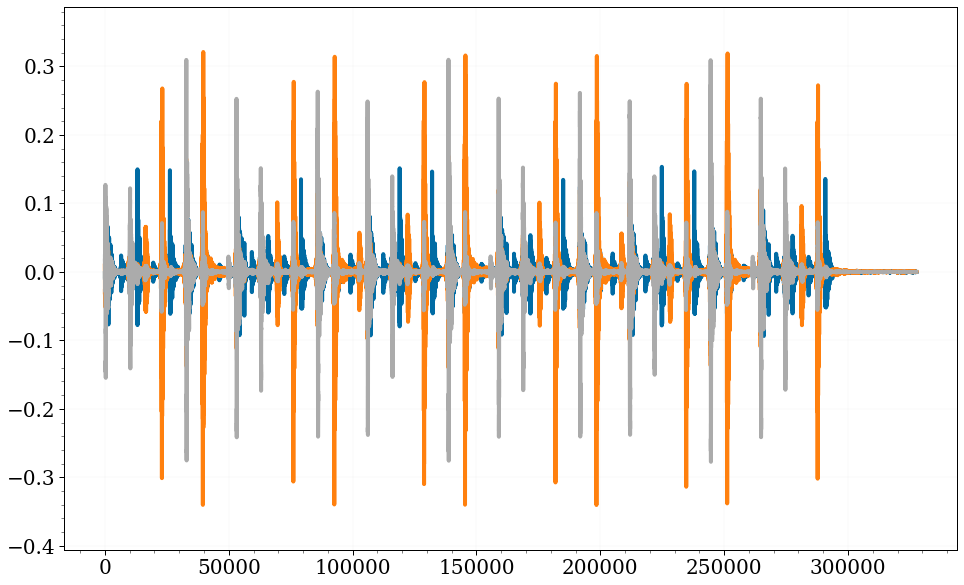

In [ ]:
# temos picos, como extraí-los?
plt.plot(wav_model_0)
plt.plot(wav_model_1)
plt.plot(wav_model_2)

In [ ]:
# Dividir índice / sample rate nos devolve a tempo desse índice
(len(wav_model_0)*.9)/sr

13.374693877551021

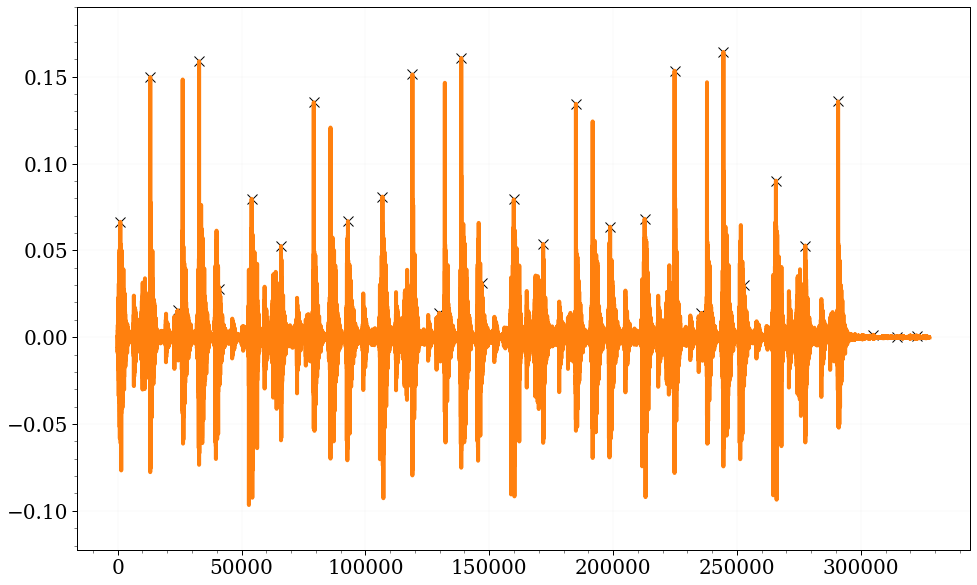

In [ ]:
from scipy.signal import find_peaks
peaks_idx = find_peaks(wav_model_0, distance=8000)[0]
plt.plot(peaks_idx, wav_model_0[peaks_idx], "x")
plt.plot(wav_model_0)

In [ ]:
peaks_sec = peaks_idx / sr
peaks_sec

array([ 0.04834467,  0.59687075,  1.1015873 ,  1.49079365,  1.86145125,
        2.45269841,  2.99079365,  3.59061224,  4.21678005,  4.84834467,
        5.39687075,  5.88825397,  6.29079365,  6.66204082,  7.25251701,
        7.79079365,  8.39061224,  9.01678005,  9.64834467, 10.19687075,
       10.68825397, 11.09079365, 11.46204082, 12.05269841, 12.59079365,
       13.19061224, 13.83324263, 14.26199546, 14.62920635])

In [ ]:
from scipy.signal import find_peaks

def extract_peak_times(waveform, sr=22050, distance=8000):
    """
    Returns a list timestamps when peaks occur in a waveform, 
    """
    # Finds indexes of peaks in waveform, considering a distance
    peaks_idx = find_peaks(waveform, distance=distance)[0]

    # Converts these indices to seconds 
    # Dividing by the sample rate yiels seconds
    peaks_sec = peaks_idx / sr
    return peaks_sec

In [ ]:
def recover_peaks(Us, Vh):
    """
    Recover audio waveform from decomposed matrices and extract peaks from each
    instrument
    """
    # Waveform recovery
    waves = recover(Us,Vh)

    # Assuming HH=0, SD=1 and KD=2
    peaks = {}
    peaks['HH'] = extract_peak_times(waves[0])
    peaks['SD'] = extract_peak_times(waves[1])
    peaks['KD'] = extract_peak_times(waves[2])

    return peaks

In [ ]:
peaks = recover_peaks(Us, Vh)

In [ ]:
peaks

{'HH': array([ 0.04834467,  0.59687075,  1.1015873 ,  1.49079365,  1.86145125,
         2.45269841,  2.99079365,  3.59061224,  4.21678005,  4.84834467,
         5.39687075,  5.88825397,  6.29079365,  6.66204082,  7.25251701,
         7.79079365,  8.39061224,  9.01678005,  9.64834467, 10.19687075,
        10.68825397, 11.09079365, 11.46204082, 12.05269841, 12.59079365,
        13.19061224, 13.83324263, 14.26199546, 14.62920635]),
 'KD': array([9.25170068e-03, 4.60816327e-01, 1.04530612e+00, 1.49061224e+00,
        1.86167800e+00, 2.40925170e+00, 2.85437642e+00, 3.45156463e+00,
        3.89687075e+00, 4.26834467e+00, 4.80925170e+00, 5.26081633e+00,
        5.84530612e+00, 6.29061224e+00, 6.66167800e+00, 7.20925170e+00,
        7.65437642e+00, 8.25156463e+00, 8.69687075e+00, 9.06897959e+00,
        9.60925170e+00, 1.00608163e+01, 1.06453061e+01, 1.10906122e+01,
        1.14616780e+01, 1.20092517e+01, 1.24543764e+01, 1.30515646e+01,
        1.34536508e+01, 1.41152834e+01, 1.46411338e+01]),

## Comparação com as anotações

In [ ]:
from collections import defaultdict
from bs4 import BeautifulSoup

def getEvents(filename):
    """
    Get a dictionary of beats and correspondent timestamps from the XML.
    The timestamps for each beat are ordered
    """
    # Extract times and names from XML file
    audiofile = audioname(files[15])
    xmlname = audiofile.replace(".wav",".xml")
    with open(f'annotation_xml/{xmlname}') as f:
        events = BeautifulSoup(f).findAll('event')
        times = []
        names = []
        for event in events:
            times.append(float(event.find('onsetsec').text))
            names.append(event.find('instrument').text)
    
    # Put them in a defaultdict
    d = defaultdict(list)
    for beat, time in list(zip(names,times)):
        d[beat].append(time)
    
    # Sorting the list in each key to speed up search later
    # (They are already sorted by construction of the XML file, 
    # but just to be sure)
    for beat in d.keys():
        d[beat] = np.array(sorted(d[beat]))
    return d

In [ ]:
peaks_anot = getEvents(files[15])
print(peaks_anot['HH'][:3], peaks_anot['KD'][:3], peaks_anot['SD'][:3])

[4.0816e-04 2.9351e-01 5.9415e-01] [1.2925e-03 4.5136e-01 1.4820e+00] [0.73789 1.0378  1.7878 ]


#### Precisão e Revocação

In [ ]:
import math

def find_nearest(array,value):
    """
    Finds the nearest value to passed as parameter in an ORDERED array

    Source: https://stackoverflow.com/a/26026189
    """
    idx = np.searchsorted(array, value, side="left")
    if (idx > 0 and (
            idx == len(array) or
            math.fabs(value - array[idx-1]) < math.fabs(value - array[idx])
                    )
        ):
        return array[idx-1]
    else:
        return array[idx]

In [ ]:
def accuracy_metrics(peaks_res, peaks_anot, tol=0.5):
    """
    Computes true positives, false positives and false negatives, within a 
    tolerance.

    """
    # Finds how many of retrieved are correct (within a tolerance)
    true_positive = 0
    tp = []
    false_positive = 0
    fp = []
    for beat, beat_times in peaks_res.items():
        for time in beat_times:
            nearest = find_nearest(peaks_anot[beat], time)
            if (abs(nearest - time) <= tol):
                true_positive += 1
                tp.append((beat,time))
            else:
                false_positive += 1
                fp.append((beat,time))

    # Finds how many of correct were reported as negative
    # i.e., are absent in retrieved
    false_negative = 0
    fn = []
    for beat, beat_times in peaks_anot.items():
        for time in beat_times:
            nearest = find_nearest(peaks_res[beat], time)
            if (abs(nearest - time) <= tol):
                # True positive, already counted
                pass
            else:
                false_negative += 1
                fn.append((beat,time))
    return true_positive, tp, false_positive, fp, false_negative, fn

In [ ]:
def f1_score(precision, recall):
    """
    Computes F1 score to summarize precision and recall into one metric
    """
    f1 = 2 * precision * recall
    f1 = f1 / (precision + recall)
    return f1

In [ ]:
def mean_interval(dict_of_vects):
    """
    Computes the mean difference two consecutive elements of a (sorted) vector, 
    considering the juxtaposition (append) of all vectors stored in a dictionary
    """
    total = 0
    intervals = []
    for key, vect in dict_of_vects.items():
        total += len(dict_of_vects[key])
        for elem in vect:
            intervals.append(elem)
    intervals = sorted(intervals)

    mean_intv = np.mean(np.diff(intervals))
    return mean_intv

In [ ]:
# Mean between event i and i+1 (considering sorted)
mean_intv = mean_interval(peaks_anot)
mean_intv

0.15345519811764707

In [ ]:
tp, _, fp, _, fn, _ = accuracy_metrics(peaks, peaks_anot, tol=mean_intv)
precision = (tp/(tp+fp))
recall = (tp/(tp+fn))
f1 = f1_score(precision, recall)
print(tp, fp, fn, (tp/(tp+fp)), (tp/(tp+fn)), f1)

53 38 30 0.5824175824175825 0.6385542168674698 0.6091954022988505


#### RMSE

In [ ]:
def rmse_approx(true, pred):
    """
    Computes the RMSE between two vectors, comparing each nearest value 
    """
    true = sorted(true)
    pred = sorted(pred)

    sum = 0
    for val_t in true:
        nearest = find_nearest(pred, val_t)
        diff = nearest - val_t
        sum += diff ** 2
    sum = sum / len(true)
    return np.sqrt(sum)

In [ ]:
def rmse(peaks_res, peaks_anot):
    sum_errors = 0
    assert (set(peaks_res.keys()) == set(peaks_anot.keys()))
    for beat, beat_times in peaks_anot.items():
        sum_errors += rmse_approx(peaks_anot[beat], peaks_res[beat])
    return sum_errors / len(peaks_anot.keys())

In [ ]:
rmse(peaks, peaks_anot)

0.13301358082363715

# OFF

In [ ]:
def precision(peaks_res, peaks_anot, tol=0.5):
    """
    Computa a precisão da separação feita. Na prática, computa, dentre todos os 
    eventos reportados, quais realmente estão corretos, considerando uma 
    tolerância de tempo em segundos.
    """
    # Finds how many events were retrieved
    total_retrieved = 0
    for beat in peaks_res.keys():
        total_retrieved += len(peaks_res[beat])

    # Finds how many of retrieved are correct (within a tolerance)
    correct_retrieved = 0
    for beat, beat_times in peaks_res.items():
        for time in beat_times:
            nearest = find_nearest(peaks_anot[beat], time)
            if (abs(nearest - time) <= tol):
                correct_retrieved += 1

    return correct_retrieved / total_retrieved

In [ ]:
for tol in np.arange(0.2,2.0,0.2):
    print(f'{tol:.1f}: {precision(peaks, peaks_anot, tol=tol):.3f}')

0.2: 0.604
0.4: 0.802
0.6: 0.857
0.8: 0.923
1.0: 0.934
1.2: 0.945
1.4: 0.956
1.6: 0.967
1.8: 0.989


Aumentar a tolerância aumenta a precisão (avá).

In [ ]:
def recall(peaks_res, peaks_anot, tol=0.5):
    """
    Computa a revocação da separação feita. Na prática, computa, dentre todos os 
    eventos existentes (anotados e corretos), quantos deles foram reportados, 
    considerando uma tolerância de tempo em segundos
    """
    # Finds how many events are annotated as correct, i.e., are relevant
    total_relevant = 0
    for beat in peaks_anot.keys():
        total_relevant += len(peaks_anot[beat])

    # Finds how many of retrieved are correct (within a tolerance)
    correct_retrieved = 0
    for beat, beat_times in peaks_res.items():
        for time in beat_times:
            nearest = find_nearest(peaks_anot[beat], time)
            if (abs(nearest - time) <= tol):
                correct_retrieved += 1

    return correct_retrieved / total_relevant

In [ ]:
for tol in np.arange(0.2,2.0,0.2):
    print(f'{tol:.1f}: {recall(peaks, peaks_anot, tol=tol):.3f}')

0.2: 0.640
0.4: 0.849
0.6: 0.907
0.8: 0.977
1.0: 0.988
1.2: 1.000
1.4: 1.012
1.6: 1.023
1.8: 1.047


In [ ]:
plt.scatter(peaks)

TypeError: ignored

In [ ]:
def f1_score(precision, recall):
    """
    Como temos precision e recall, convém computar a métrica f1 para sumarizar 
    as duas em uma única métrica.
    """
    pass

SyntaxError: ignored

In [ ]:
"max(times)

13.0441

In [ ]:
print(len(times), len(names))

86 86


Para saber qual som é qual: 

KD: bumbo (grave) \\
HH: prato (metálico, agudo) \\
SD: caixa (agudo)

Usando o stack de Us feito, temos:

     Us =    |  |  |
             HH SD KD
             |  |  |

Assim, o HH é o índice 0, o SD é índice 1 e o KD é o índice 2. Ou seja, na recuperação, o prato deve ser o primeiro, a caixa o segundo e o bumbo o terceiro. Na decomposição a partir do Random não temos essa garantia de ordem (assim, na hora de verificar com as anotações, temos que fazer todas as possibilidades e tomar a com melhor precisão)

In [ ]:
X, A = KD_stfts[KD_files[2]]
k = 1   # HH, KD ou SD (um apenas)
Us, Vh = run_SVD_internal(X)

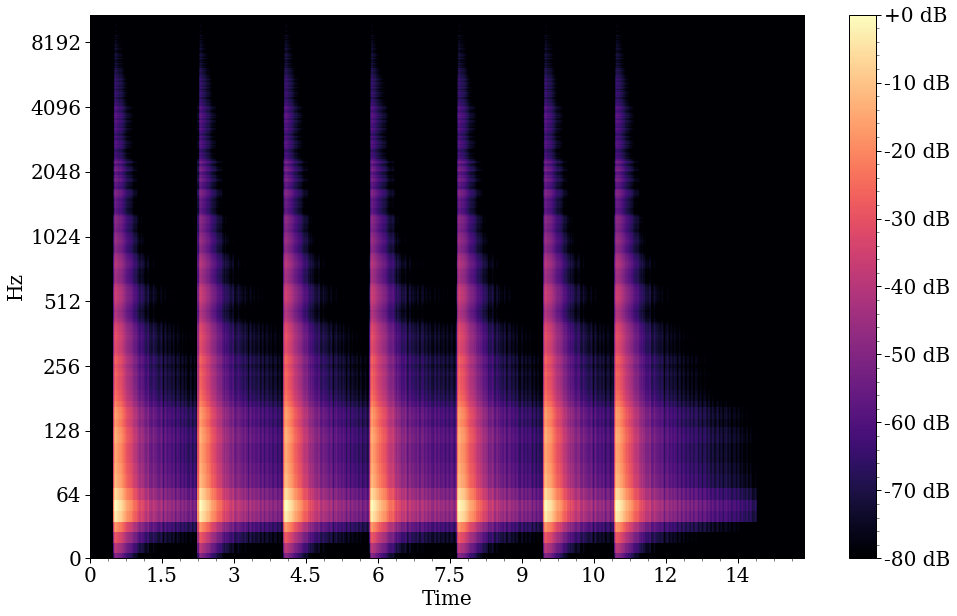

In [ ]:
plot_spec(Us @ Vh)

In [ ]:
# Us tem as frequências
print(Us.shape)

# Vh tem os tempos
print(Vh.shape)

(1025, 1)
(1, 641)


In [ ]:
# Carregar com librosa
wav, sr = librosa.load(files[1])

# Extração dos fatores
S = librosa.stft(wav)
X = np.abs(S)
A = np.angle(S)

In [ ]:
k = 3   # HH, KD, SD
rows, cols = X.shape
Us = jnp.array(np.random.normal(size=(rows, k)))
Vh = jnp.array(np.random.normal(size=(k, cols)))

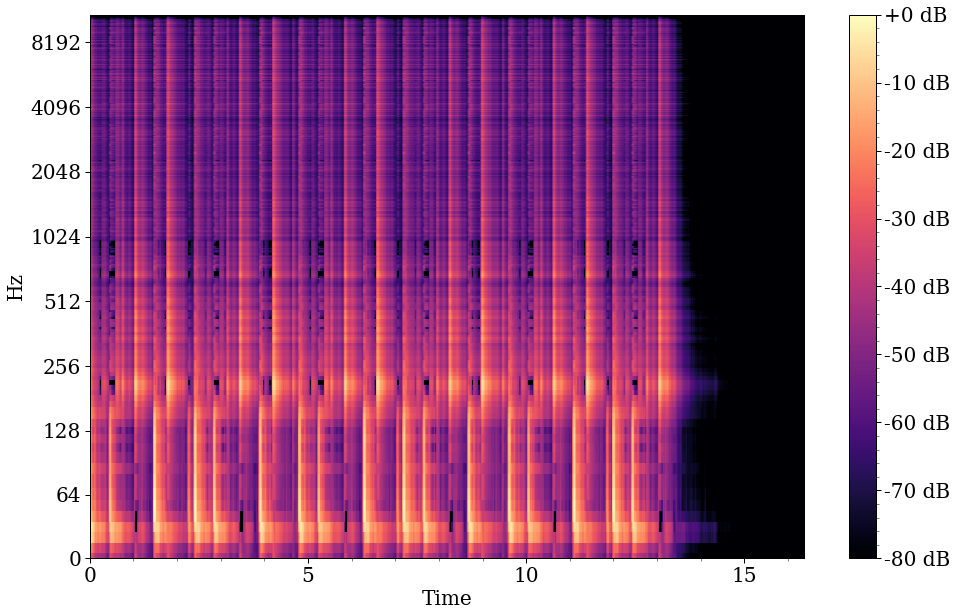

In [ ]:
# NMF
Us, Vh = nmf(X, 3, verbose=False)
plot_spec(Us @ Vh)

0 0.28756857
100 0.06202627
200 0.061971504
300 0.061931033
400 0.061916158
500 0.061911285
600 0.061908077
700 0.06190662
800 0.061905615
900 0.06190486
1000 0.0619041
1100 0.061903507
1200 0.06190312
1300 0.06190288
1400 0.06190274
1500 0.061902665
1600 0.061902568
1700 0.0619024
1800 0.061902296
1900 0.061902117
2000 0.061902005
2100 0.061901882
2200 0.061901733
2300 0.061901577
2400 0.061901398
2500 0.061901204
2600 0.06190101
2700 0.061900817
2800 0.06190063
2900 0.06190046
3000 0.06190029
3100 0.061900172
3200 0.061900053
3300 0.06189999
3400 0.061899964
3500 0.061899953
3600 0.06189994
3700 0.061899934
3800 0.06189993
3900 0.061899934
4000 0.06189993
4100 0.061899923
4200 0.061899923
4300 0.06189993
4400 0.06189993
4500 0.061899923
4600 0.06189993
4700 0.06189993
4800 0.061899923
4900 0.06189992
0 3.4360497
100 0.6759228
200 0.5969997
300 0.46345717
400 0.26724342
500 0.17045078
600 0.12460147
700 0.109784976
800 0.10593648
900 0.10487317
1000 0.10446514
1100 0.104168504
1200 0.

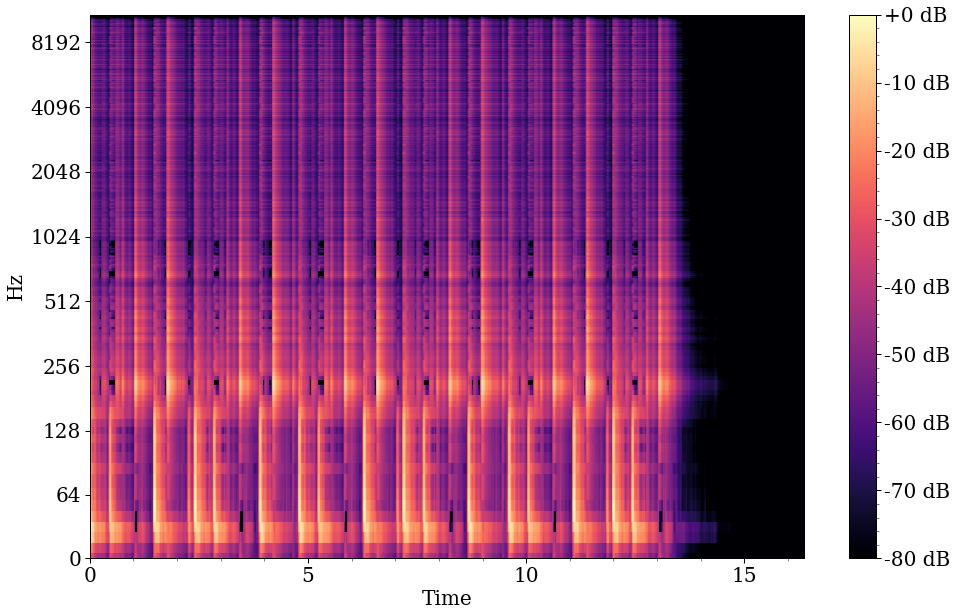

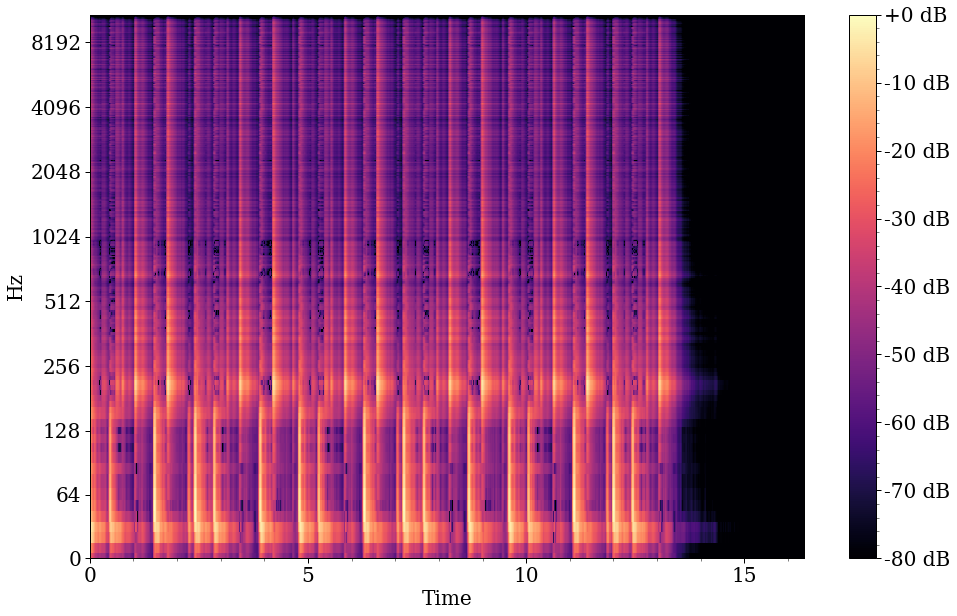

In [ ]:
# NMF
Us, Vh = nmf(X, 3)
plot_spec(Us @ Vh)

# SVD
Us, Vh = svd(X, 3, verbose=True)
plot_spec(Us @ Vh)

# Recover
X_model = recover_from_one(Us, Vh, 1)
S_model = X_model * np.exp(1j * A)
wav_model = librosa.istft(np.asarray(S_model))
ipd.Audio(wav_model, rate=sr)